In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader 
from torch.autograd import Variable
from torch.backends import cudnn


import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import numpy as np


# Augmenting library 

import torchvision
import torchvision.transforms.functional as TF
import albumentations as A
import torchvision.transforms as T

# Control Randomness
import random
random_seed = 7
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

import warnings
warnings.filterwarnings("ignore")
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "2, 3"
print(torch.cuda.device_count())


# logging
import datetime
from tensorboardX import SummaryWriter
from tqdm import tqdm
import time 
import warnings
warnings.filterwarnings('ignore')

/home/sklab2/anaconda3/envs/vessel2/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2


In [2]:
import joint_transforms
from config import cod_training_root
from config import backbone_path
from datasets import ImageFolder
from misc import AvgMeter, check_mkdir
from PFNet import PFNet
from helper import *
import loss

# Config

In [3]:
ckpt_path = './ckpt'
exp_name = 'PFNet'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args = {
    'epoch_num': 300,
    'train_batch_size': 32,
    'last_epoch': 0,
    'lr': 5e-4, 
    'lr_decay': 0.9,
    'weight_decay': 1e-4,
    'momentum': 0.9,
    'snapshot': '',
    'scale': 416, 
    'save_point': [],
    'poly_train': False,
    'optimizer': 'Adam',
    'amp' : False
}

In [4]:
from helper import BinaryFocalLoss, sigmoid_focal_loss
# loss function
structure_loss = loss.structure_loss().to(device)
bce_loss = nn.BCEWithLogitsLoss().to(device)
iou_loss = loss.IOU().to(device)

def bce_iou_loss(pred, target):
    bce_out = bce_loss(pred, target)
    iou_out = iou_loss(pred, target)
    loss = bce_out + iou_out
    return loss

def focal_iou_loss(pred, target):
    focal_out = sigmoid_focal_loss(pred, target, alpha=0.25)
    iou_out = iou_loss(pred, target)
    loss = focal_out + iou_out
    return loss

# Net

In [5]:
net = PFNet(backbone_path)

From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!


In [6]:
from torch.optim.lr_scheduler import ReduceLROnPlateau



if args['optimizer'] == 'SGD':
    print('SGD opt')
    optimizer = torch.optim.SGD([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
        'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
        'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ], momentum=args['momentum'])

else:
    print('Adam opt')
    optimizer = torch.optim.Adam([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
            'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
            'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ])

# scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=20, \
#                                 threshold=0.05, threshold_mode='rel', cooldown=5, min_lr = 1e-4)

scheduler = CosineAnnealingWarmupRestarts(optimizer, first_cycle_steps=100, cycle_mult=1.0, max_lr=0.005, min_lr=5e-4, warmup_steps=10, gamma=0.8)

Adam opt


## making data index list

In [7]:
mask_files = os.walk("/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/masked")
mask_idx = []
for (root, dirs, files) in mask_files:
    if len(files) > 0 :
        mask_idx.append(files)

mask_idxs = [element for array in mask_idx for element in array]
len(mask_idxs)

1691

In [8]:
# 1~ 11 / 12, 13, 14  , 40, 41, 43, 44, 46, 49,  50, 53, 54, 55 
train_indexs = []
test_indexs = []
for idx, data in enumerate(mask_idxs):
    tmp = mask_idxs[idx].split('_')
    if len(tmp) < 3:
        if int(tmp[0]) < 45:
            train_indexs.append([ tmp[0], tmp[1].split('.')[0]])
        else:
            test_indexs.append([tmp[0], tmp[1].split('.')[0]])

In [9]:
len(train_indexs) , len(test_indexs)

(1319, 355)

# Dataloader

In [10]:
import albumentations.augmentations.functional as AF

PATH = '/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/'
class VesselDataset(Dataset):
    def __init__(self, index, transforms):
        self.index = index
        self.transforms = transforms
        
    def __len__(self):
        return len(self.index)
        
    def __getitem__(self, idx):
        s_1 = self.index[idx][0]
        s_2 = self.index[idx][1]

        # '1_L_0.jpg', 
        # image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').convert("L").resize((416, 416),Image.Resampling.BILINEAR)
        image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').resize((416, 416),Image.Resampling.BILINEAR)
        #'10_L_112_L.png', 
        mask = Image.open(PATH+'masked/' +  s_1+'_'+s_2+'.png').resize((416, 416),Image.Resampling.BILINEAR)
        
        image = np.array(image, dtype=np.uint8) #RGB
        mask = np.array(mask, dtype=np.uint8)   # HWC
        # mask_o = mask / 255        # CHW
        mask_o = mask.transpose(2, 0, 1)
        lower_red = np.array([-10, 100, 100]) 
        upper_red = np.array([10, 255, 255])

        mask_hsv = cv2.cvtColor(mask, cv2.COLOR_RGB2HSV)

        mask_r = cv2.inRange(mask_hsv, lower_red, upper_red)
        mask_r = mask_r/255
        mask_r = np.clip(mask_r, 0 ,1)
        mask_r = np.expand_dims(mask_r,axis=0)
        mask = np.concatenate([mask_r, mask_o], axis=0)
        
        # aft_mask = cv2.resize(aft_mask, (416, 416), interpolation=cv2.INTER_NEAREST)
        masks = [mask_r, mask_o]
        # for num in range(3): #### 3번 이터레이션이 왜들어갔지?
        if self.transforms:
            transformed = self.transforms(image=image, masks=masks)
            image, masks = transformed['image'], transformed['masks']
        # urls.append(s_1+'_'+s_2)
        # assert sum(masks[0]==0).sum() + sum(masks[0]==1).sum() == 416*416   # mask가 0 또는 1이 아닐경우 스탑
                    
        return image, masks

In [11]:
import albumentations.pytorch as AP

prob = 0.5

train_transform = A.Compose([
    # A.RandomRotate90(p=prob),
    # A.HorizontalFlip(p=prob),
    # A.OneOf([
    #     A.OpticalDistortion(p=1, distort_limit=0.1, interpolation=cv2.INTER_NEAREST),
    #     A.GridDistortion(p=1, interpolation=cv2.INTER_NEAREST),
    #     A.ElasticTransform(p=1, interpolation=cv2.INTER_NEAREST),
    #     ], p = prob),
    # A.RandomBrightnessContrast(p=prob),    # 밝기 및 조도 변화
    # A.Normalize(mean=(126.71482973095203, 126.6879562017254, 126.85466873988524), std = (32.9434, 33.0122, 32.9186)),
    AP.ToTensorV2(always_apply=True)
])

test_transform = A.Compose([
    AP.ToTensorV2(always_apply=True)
])

# tensor([127.5388, 127.5482, 127.6733])
# tensor([57.4250, 57.6999, 57.5387])
train_dataset = VesselDataset(index=train_indexs, transforms=train_transform)
test_dataset = VesselDataset(index=test_indexs, transforms=test_transform)
 
#train_dataset, _, test_dataset = torch.utils.data.random_split(dataset, [train, 0, test])

train_loader = DataLoader(dataset=train_dataset, batch_size=args['train_batch_size'], shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

image, masks = next(iter(train_loader))
print(image.shape, masks[0].shape, masks[1].shape)

torch.Size([32, 3, 416, 416]) torch.Size([32, 1, 416, 416]) torch.Size([32, 3, 416, 416])


In [12]:
def get_mean_std(dataset):
    meanRGB = [np.mean(image.numpy(), axis=(1, 2)) for image, _, _, _ in dataset]
    stdRGB = [np.std(image.numpy(), axis=(1, 2)) for image, _, _, _ in dataset]

    meanR = np.mean([m[0] for m in meanRGB])
    meanG = np.mean([m[1] for m in meanRGB])
    meanB = np.mean([m[2] for m in meanRGB])

    stdR = np.mean([s[0] for s in stdRGB])
    stdG = np.mean([s[1] for s in stdRGB])
    stdB = np.mean([s[2] for s in stdRGB])

    print(meanR, meanG, meanB)
    print(stdR, stdG, stdB)

In [13]:
# get_mean_std(train_dataset)

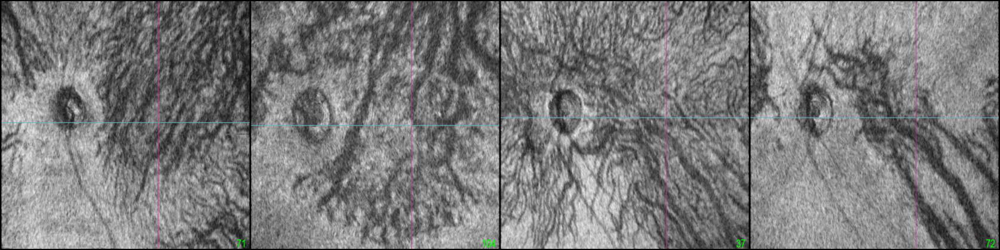

In [14]:
TF.to_pil_image(torchvision.utils.make_grid(image[:4]))

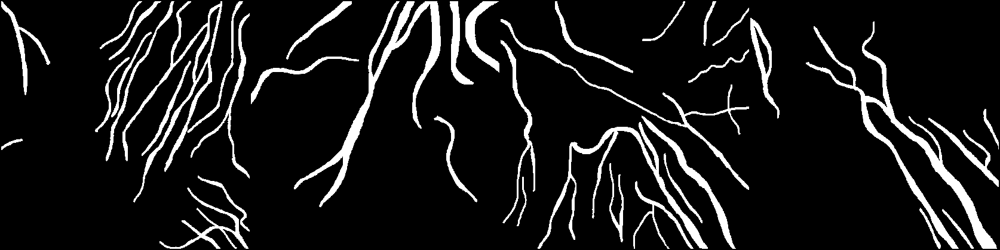

In [15]:
TF.to_pil_image(torchvision.utils.make_grid(masks[0][:4].expand(4, 3, 416, 416)))

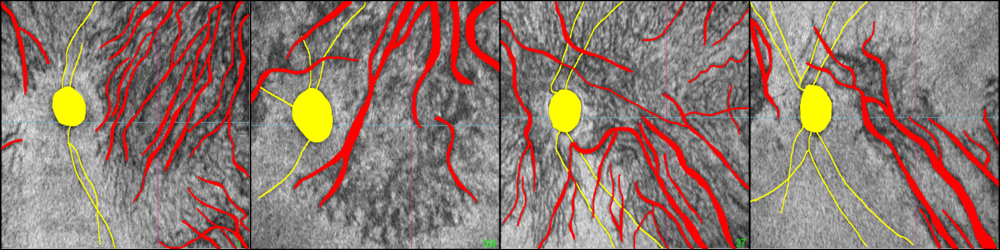

In [16]:
TF.to_pil_image(torchvision.utils.make_grid(masks[1][:4]))

In [17]:
from sklearn.metrics import jaccard_score, precision_score, recall_score
def calc_metric(labels, preds):
    accuracy = np.mean(np.equal(labels,preds))
    right = np.sum(labels *preds == 1)
    precision = right / np.sum(preds)
    recall = right / np.sum(labels)
    f1 = 2 * precision*recall/(precision+recall)

    
    y_pred = preds
    y_true = labels
    """ Ground truth """
    #y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    #y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)

    print('jaccard, f1, recall, precision, acc')
    print(score_jaccard, f1, recall, precision, accuracy)
    return score_jaccard, f1, recall, precision, accuracy

# Train

Using 2 GPUs.
aug50+focal+coslr_b32_e300_js_220928_01:55
../model/vessel_PFNet_aug50+focal+coslr_b32_e300_220928_01:55.pt
Training 300 epochs.


100%|██████████| 42/42 [03:23<00:00,  4.83s/it, Epoch=0, Loss=7.129524, Mean Loss=8.080657, lr=0.000500] 


Testing...
jaccard, f1, recall, precision, acc
0.3377387941005009 0.5049398217199754 0.4200769397726548 0.6327705241645937 0.9251285914451204
Model Saved


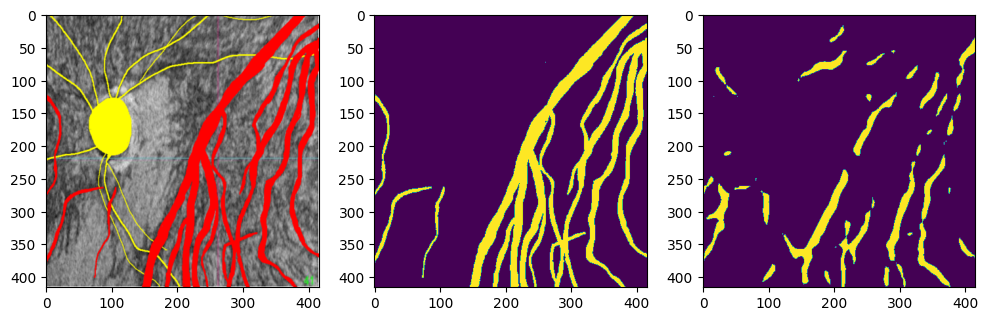

100%|██████████| 42/42 [03:36<00:00,  5.16s/it, Epoch=5, Loss=5.595530, Mean Loss=5.185256, lr=0.002750]


Testing...
jaccard, f1, recall, precision, acc
0.35209884637009686 0.5208182039580267 0.5505197965368864 0.49415746653642 0.9079219980571298
Model Saved


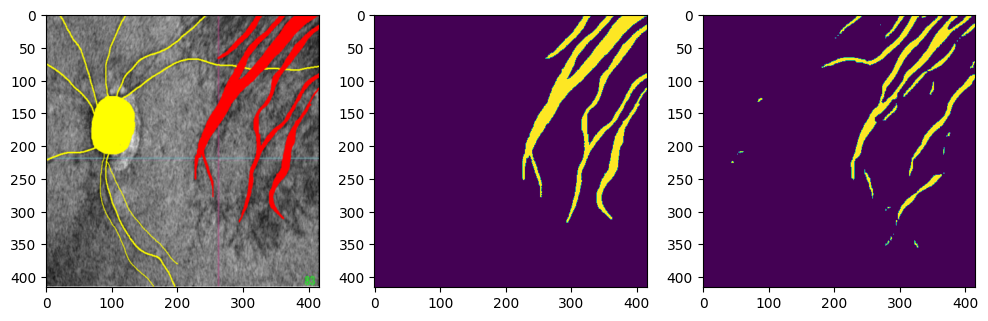

100%|██████████| 42/42 [03:28<00:00,  4.96s/it, Epoch=10, Loss=5.038842, Mean Loss=5.060845, lr=0.005000]


Testing...
jaccard, f1, recall, precision, acc
0.15748558554064787 0.2721167114441226 0.1645303063622695 0.7862377689881271 0.919994244312026


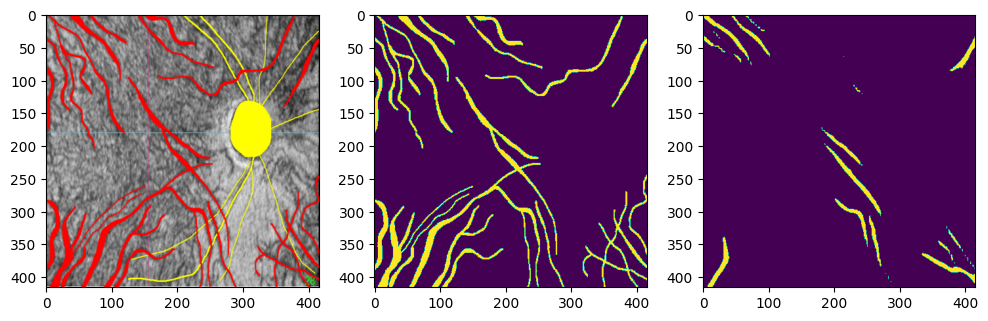

100%|██████████| 42/42 [03:21<00:00,  4.80s/it, Epoch=15, Loss=5.321489, Mean Loss=5.007043, lr=0.004966]


Testing...
jaccard, f1, recall, precision, acc
0.3535211203304286 0.5223725215963017 0.4298776098170021 0.6655831858716249 0.92854664972081
Model Saved


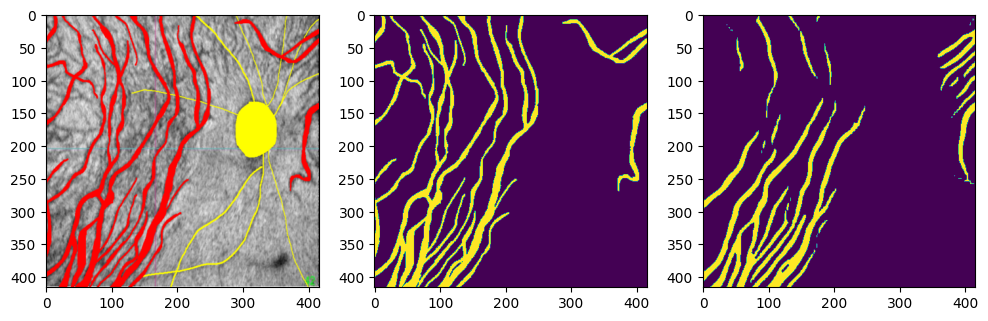

100%|██████████| 42/42 [03:31<00:00,  5.03s/it, Epoch=20, Loss=4.789125, Mean Loss=4.899959, lr=0.004864]


Testing...
jaccard, f1, recall, precision, acc
0.20891523885379926 0.3456242954665319 0.6258041570829217 0.23873834022186824 0.7846077179608717
Model Saved


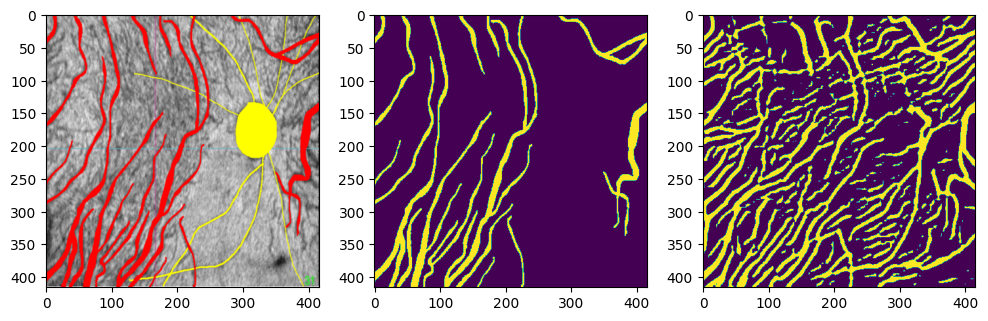

100%|██████████| 42/42 [03:34<00:00,  5.11s/it, Epoch=25, Loss=5.122441, Mean Loss=5.011323, lr=0.004699]


Testing...
jaccard, f1, recall, precision, acc
0.3877322350656549 0.5587997817854407 0.6297272545588302 0.5022323245739945 0.9096140824235353
Model Saved


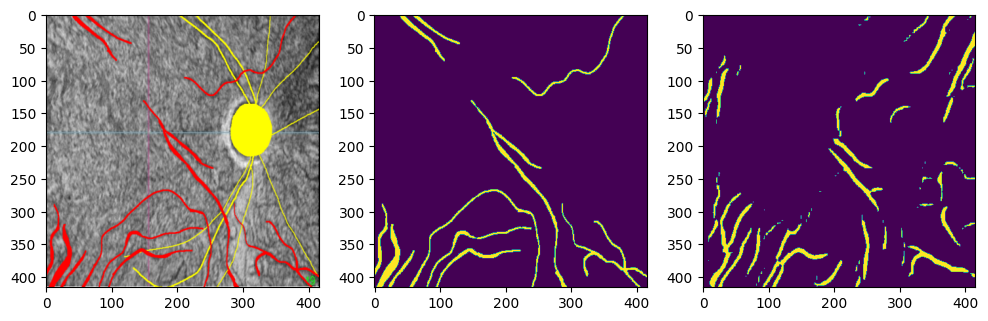

100%|██████████| 42/42 [03:32<00:00,  5.06s/it, Epoch=30, Loss=5.084450, Mean Loss=4.915372, lr=0.004474]


Testing...
jaccard, f1, recall, precision, acc
0.4418862322904728 0.6129280138676758 0.5711478001499971 0.6613032148986476 0.9344308477529377
Model Saved


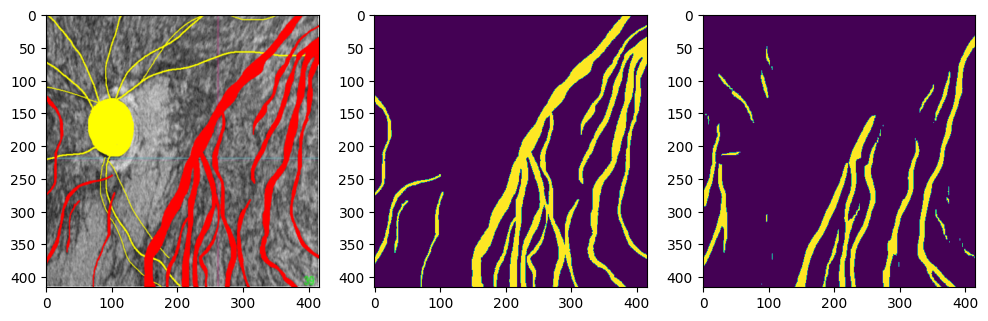

100%|██████████| 42/42 [03:27<00:00,  4.93s/it, Epoch=35, Loss=4.792111, Mean Loss=4.856497, lr=0.004196]


Testing...
jaccard, f1, recall, precision, acc
0.36162092975375737 0.5311624136376264 0.41770968613071235 0.729224685898935 0.9329747531044253


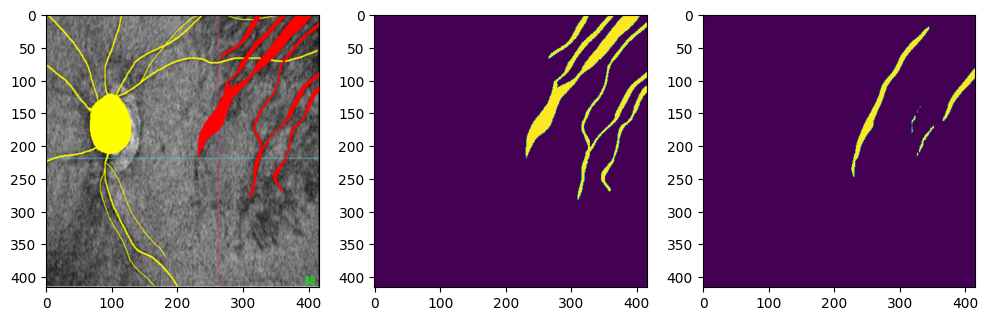

100%|██████████| 42/42 [03:26<00:00,  4.92s/it, Epoch=40, Loss=4.747163, Mean Loss=4.814390, lr=0.003875]


Testing...
jaccard, f1, recall, precision, acc
0.46263510527652574 0.6326049519904828 0.6357425393634937 0.6294981824629843 0.9328801814213684
Model Saved


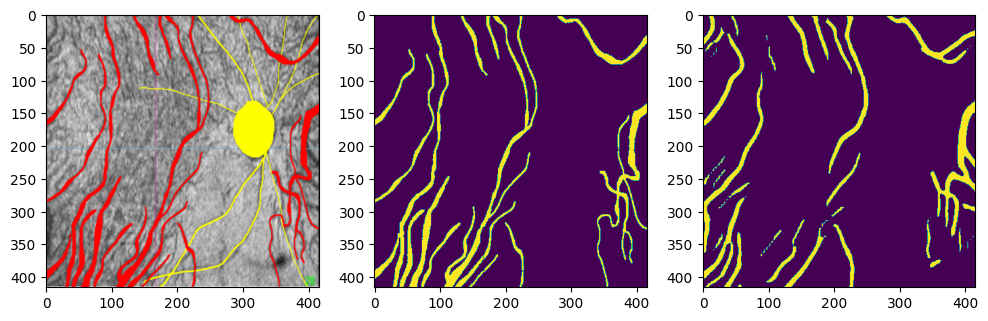

100%|██████████| 42/42 [03:35<00:00,  5.12s/it, Epoch=45, Loss=4.788351, Mean Loss=4.903963, lr=0.003520]


Testing...
jaccard, f1, recall, precision, acc
0.41687117930228273 0.5884390696796653 0.6253867224631042 0.5556135917288324 0.9204848125364614


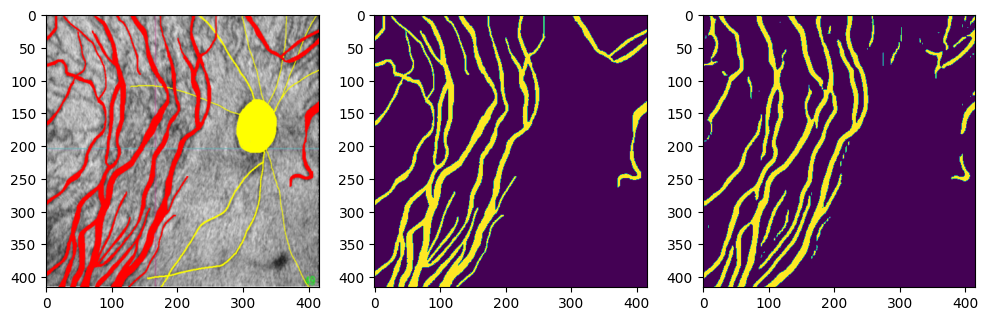

100%|██████████| 42/42 [03:33<00:00,  5.09s/it, Epoch=50, Loss=4.723875, Mean Loss=4.741154, lr=0.003141]


Testing...
jaccard, f1, recall, precision, acc
0.4599547734883478 0.630094550654269 0.6159812811643328 0.6448697073747341 0.93426126981936


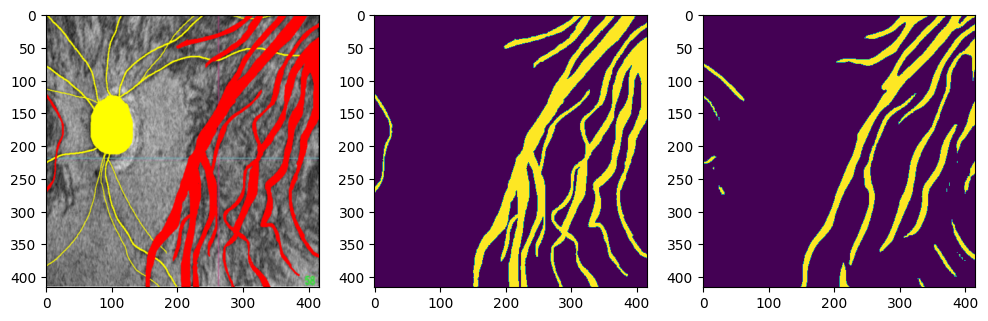

100%|██████████| 42/42 [03:32<00:00,  5.06s/it, Epoch=55, Loss=4.729528, Mean Loss=4.694304, lr=0.002750]


Testing...
jaccard, f1, recall, precision, acc
0.4581314694694916 0.628381567865307 0.6380494431697954 0.6190022993657851 0.9314042934567464
Model Saved


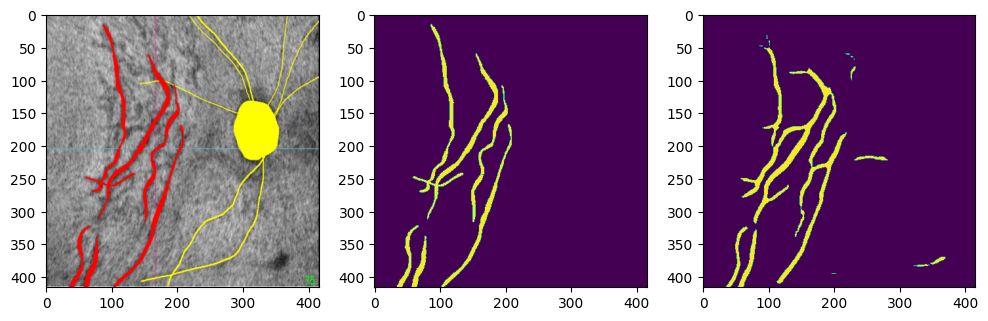

100%|██████████| 42/42 [03:31<00:00,  5.03s/it, Epoch=60, Loss=4.872742, Mean Loss=4.659183, lr=0.002359]


Testing...
jaccard, f1, recall, precision, acc
0.43292899542662977 0.604257429095756 0.5735274102864772 0.6384669563582668 0.9317168195005834


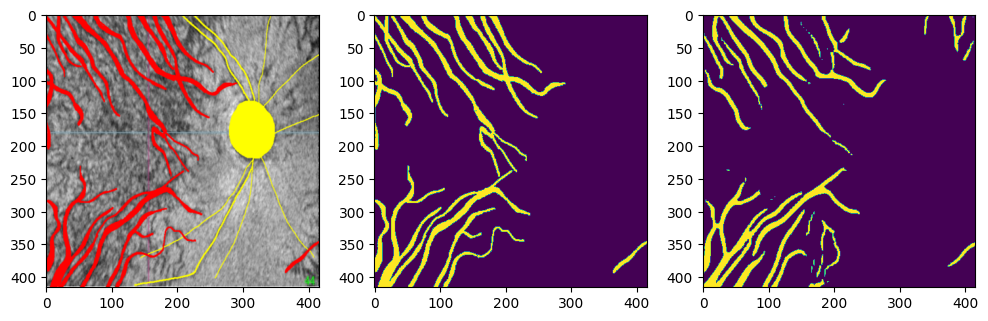

100%|██████████| 42/42 [03:15<00:00,  4.66s/it, Epoch=65, Loss=5.361528, Mean Loss=4.624785, lr=0.001980]


Testing...
jaccard, f1, recall, precision, acc
0.482302527012939 0.650747763325818 0.6367736798786843 0.6653489345530542 0.9378729965778398
Model Saved


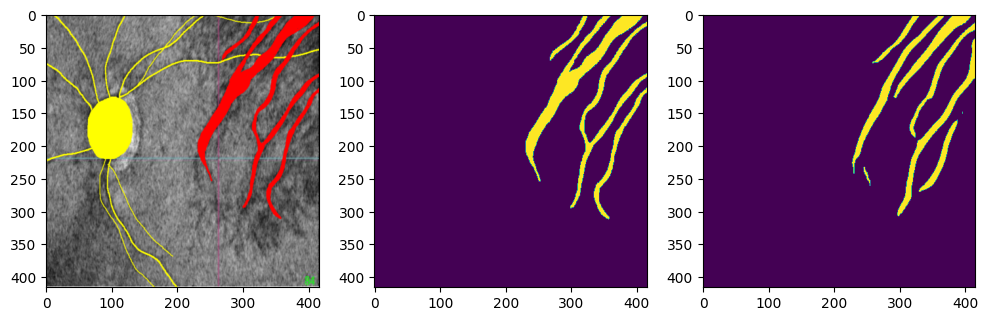

100%|██████████| 42/42 [03:34<00:00,  5.12s/it, Epoch=70, Loss=4.968667, Mean Loss=4.585268, lr=0.001625]


Testing...
jaccard, f1, recall, precision, acc
0.4782722282870614 0.6470692192347499 0.7304310733245131 0.5807859080597382 0.9275752797108092
Model Saved


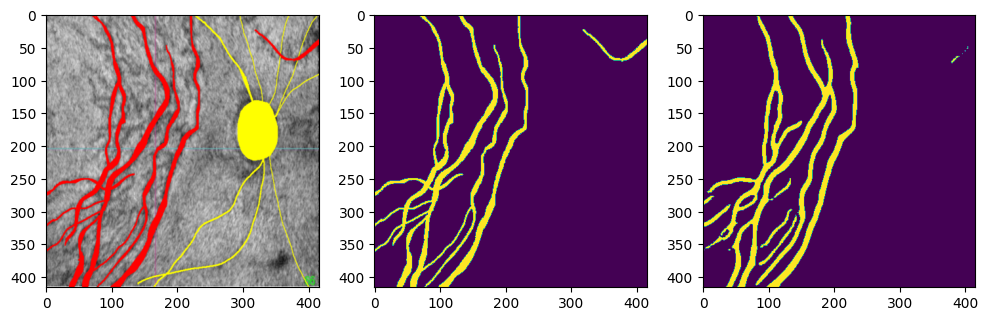

100%|██████████| 42/42 [03:22<00:00,  4.82s/it, Epoch=75, Loss=4.846544, Mean Loss=4.517221, lr=0.001304]


Testing...
jaccard, f1, recall, precision, acc
0.46572053296838656 0.6354833987693499 0.6530455714681737 0.6188410779886885 0.9319034073151929


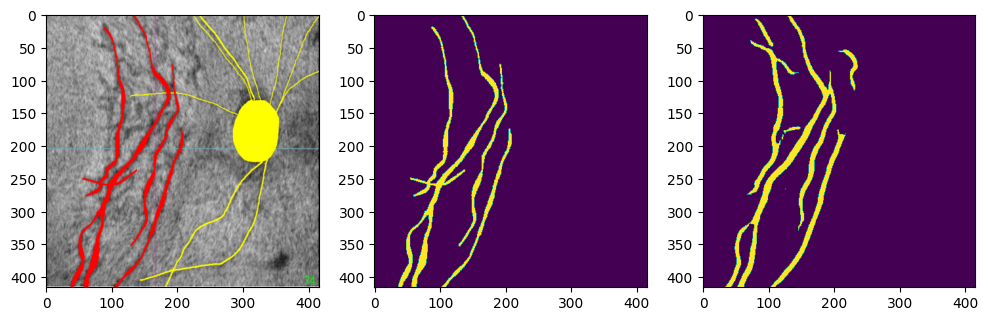

100%|██████████| 42/42 [03:22<00:00,  4.83s/it, Epoch=80, Loss=4.431656, Mean Loss=4.438269, lr=0.001026]


Testing...
jaccard, f1, recall, precision, acc
0.4827324863829766 0.6511390163987965 0.7426623912001702 0.5796987657082151 0.9276665959142428
Model Saved


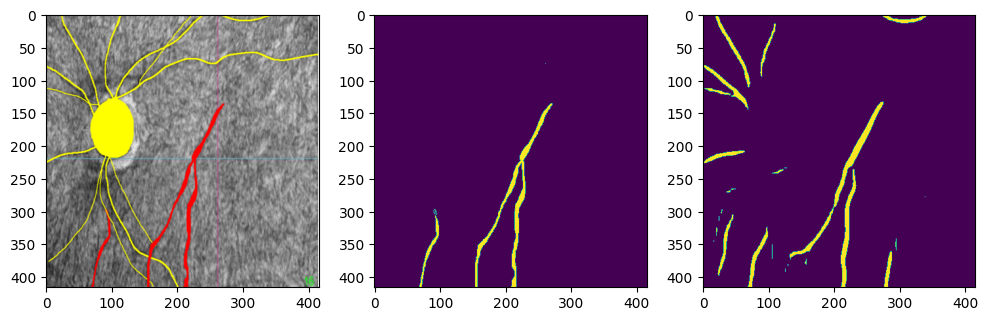

100%|██████████| 42/42 [03:26<00:00,  4.91s/it, Epoch=85, Loss=4.958694, Mean Loss=4.440836, lr=0.000801]


Testing...
jaccard, f1, recall, precision, acc
0.46083895456437435 0.6309236937096843 0.6152312956697829 0.6474375609060197 0.9345745771783065


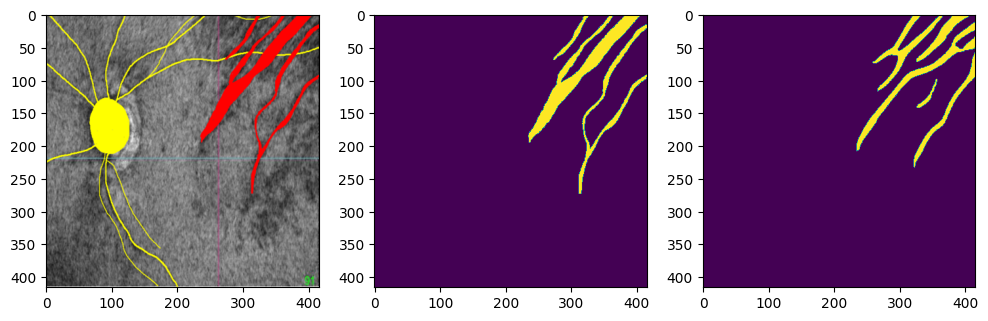

100%|██████████| 42/42 [03:20<00:00,  4.78s/it, Epoch=90, Loss=5.347566, Mean Loss=4.389437, lr=0.000636]


Testing...
jaccard, f1, recall, precision, acc
0.4599647749521349 0.6301039351681822 0.6091069513698517 0.6526002077150026 0.9349975290909659


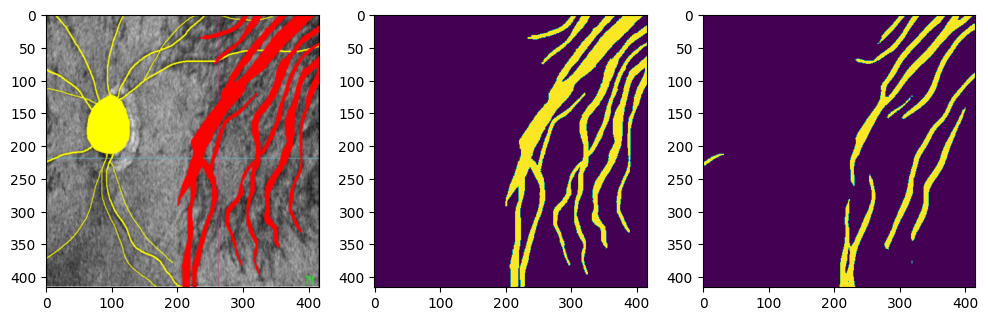

100%|██████████| 42/42 [03:27<00:00,  4.93s/it, Epoch=95, Loss=4.801070, Mean Loss=4.331935, lr=0.000534]


Testing...
jaccard, f1, recall, precision, acc
0.4766380836116407 0.6455719771846242 0.6603197860786361 0.6314685418875501 0.9340968029887907


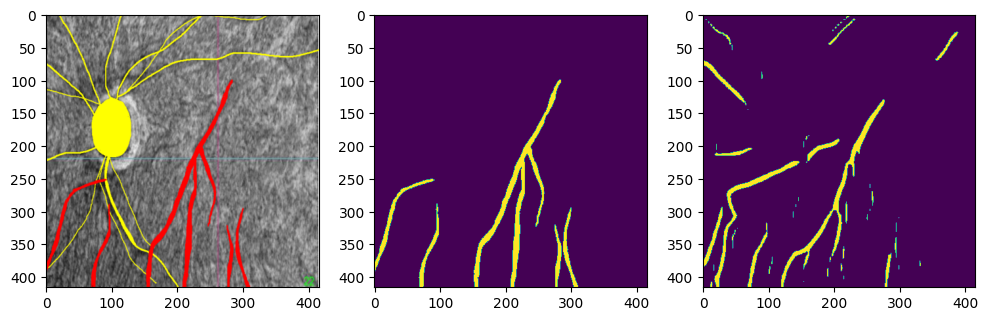

100%|██████████| 42/42 [03:31<00:00,  5.05s/it, Epoch=100, Loss=3.788744, Mean Loss=4.287110, lr=0.000500]


Testing...
jaccard, f1, recall, precision, acc
0.47309899255504717 0.6423179907746333 0.6675984776798729 0.6188822792221816 0.9324179847018501


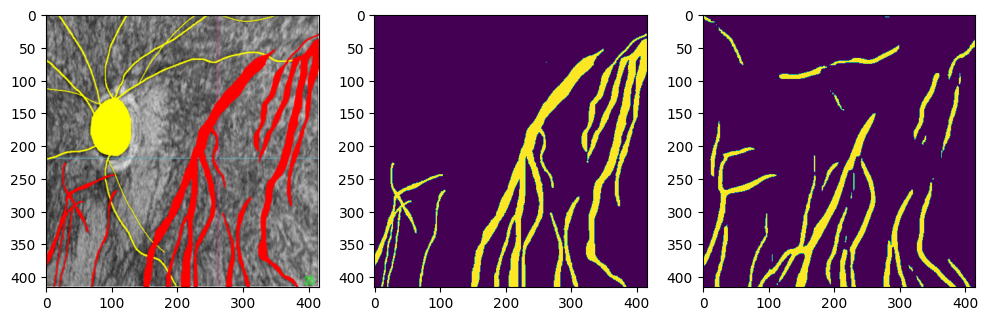

100%|██████████| 42/42 [03:20<00:00,  4.78s/it, Epoch=105, Loss=4.909352, Mean Loss=4.460810, lr=0.001500]


Testing...
jaccard, f1, recall, precision, acc
0.45171449622775683 0.622318641029659 0.6237162676653102 0.6209272640078157 0.9311872994624552


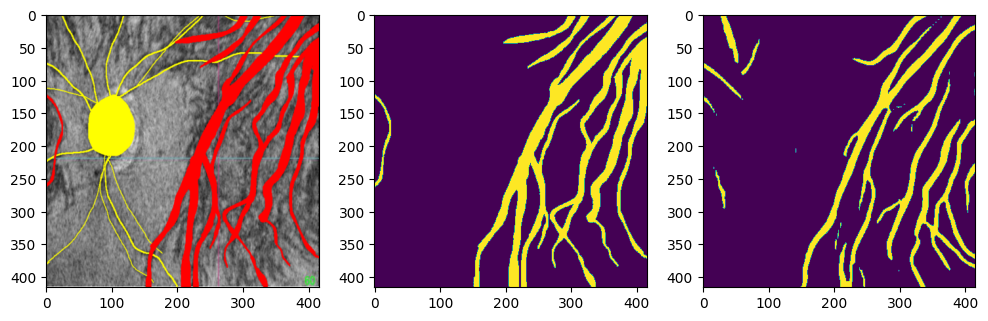

100%|██████████| 42/42 [03:31<00:00,  5.03s/it, Epoch=110, Loss=4.383113, Mean Loss=4.578590, lr=0.002500]


Testing...
jaccard, f1, recall, precision, acc
0.4590806548413826 0.6292738558599963 0.5686129279734561 0.7044233502702489 0.9391025586767647


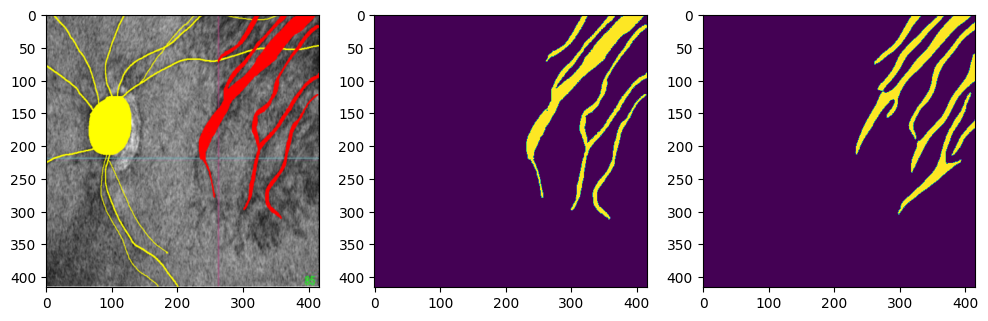

100%|██████████| 42/42 [03:26<00:00,  4.92s/it, Epoch=115, Loss=4.580549, Mean Loss=4.564826, lr=0.002485]


Testing...
jaccard, f1, recall, precision, acc
0.3274336181806143 0.49333332182651224 0.5118468339079402 0.4761123276800358 0.9044367955142095


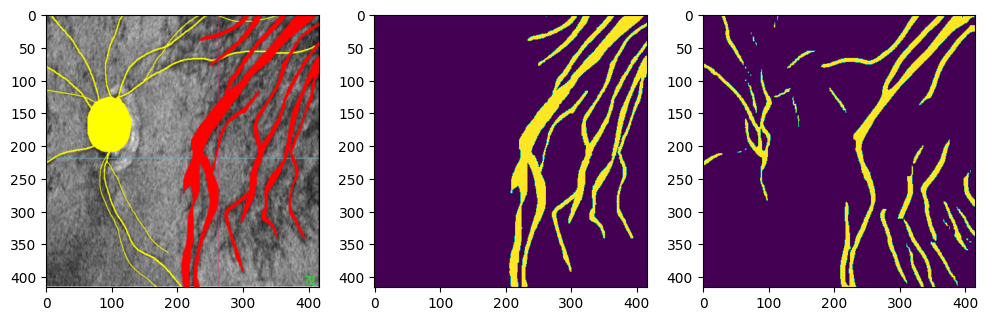

100%|██████████| 42/42 [03:38<00:00,  5.19s/it, Epoch=120, Loss=4.522770, Mean Loss=4.571442, lr=0.002440]


Testing...
jaccard, f1, recall, precision, acc
0.44476585929147583 0.6156926486477088 0.558003892474859 0.6866849902901838 0.9366829397241436


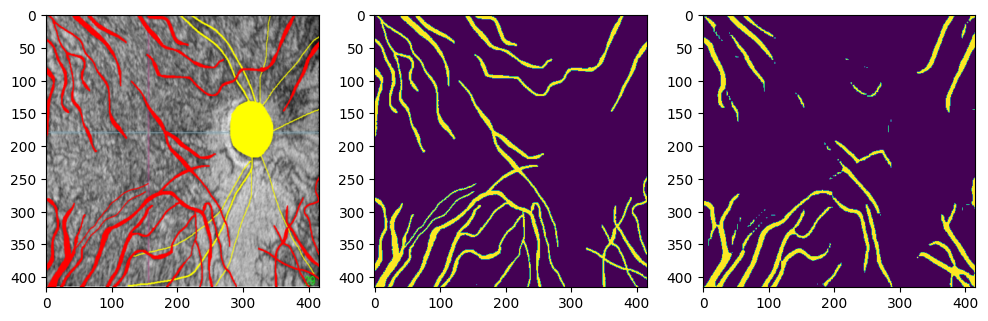

100%|██████████| 42/42 [03:30<00:00,  5.01s/it, Epoch=125, Loss=4.700219, Mean Loss=4.552819, lr=0.002366]


Testing...
jaccard, f1, recall, precision, acc
0.4445317423779422 0.615468292370188 0.6842254841775983 0.5592679669450134 0.9222868507271439


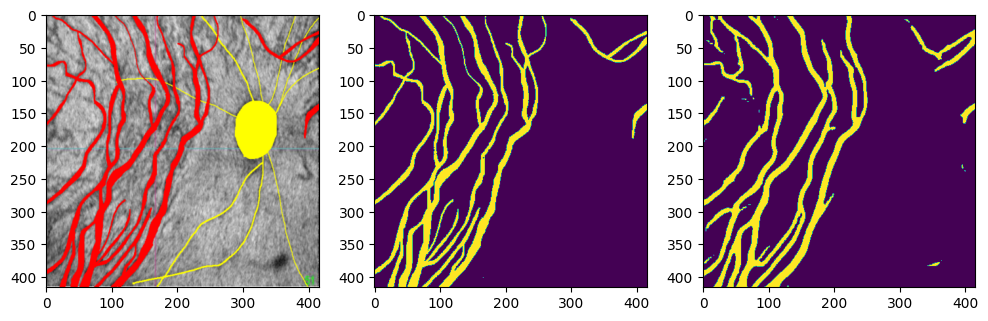

100%|██████████| 42/42 [03:39<00:00,  5.23s/it, Epoch=130, Loss=5.036507, Mean Loss=4.578444, lr=0.002266]


Testing...
jaccard, f1, recall, precision, acc
0.3710250504482357 0.541237449055996 0.5849693451487686 0.5035894561287154 0.9098632242791066


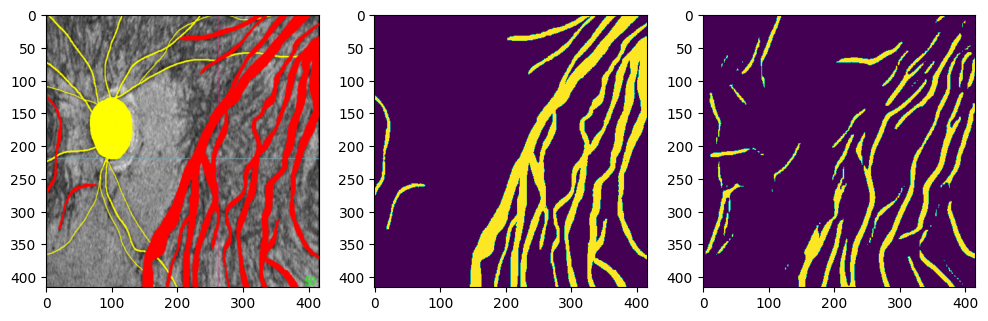

100%|██████████| 42/42 [03:19<00:00,  4.76s/it, Epoch=135, Loss=4.673842, Mean Loss=4.493470, lr=0.002143]


Testing...
jaccard, f1, recall, precision, acc
0.4651261094470451 0.6349297940265207 0.5976551671278564 0.6771631863022498 0.9375301945735062


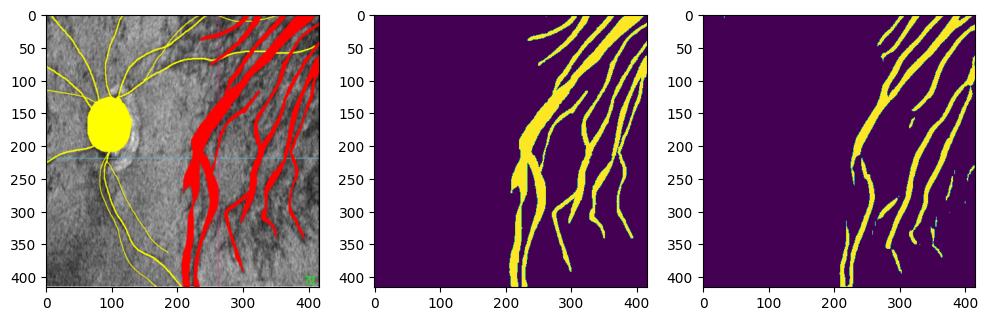

100%|██████████| 42/42 [03:32<00:00,  5.07s/it, Epoch=140, Loss=4.941924, Mean Loss=4.497249, lr=0.002000]


Testing...
jaccard, f1, recall, precision, acc
0.45405196773846174 0.6245333424288332 0.7082681781942612 0.5585043047401284 0.9225926379281607


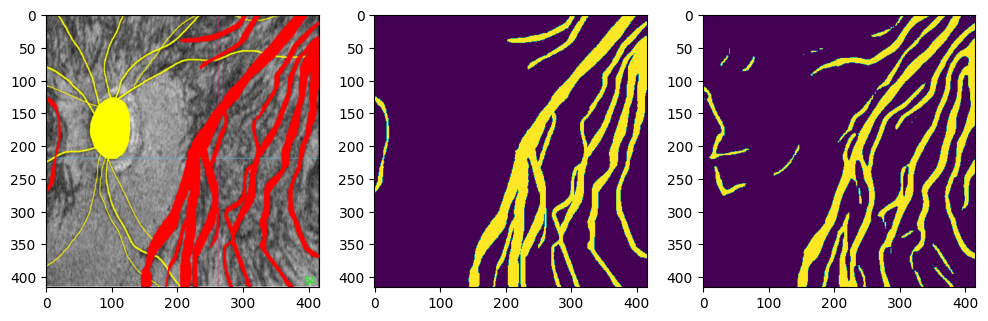

100%|██████████| 42/42 [03:35<00:00,  5.14s/it, Epoch=145, Loss=4.884056, Mean Loss=4.476802, lr=0.001842]


Testing...
jaccard, f1, recall, precision, acc
0.37106575820142046 0.5412807605788196 0.6380840055385748 0.46998038896020333 0.9016960397741478


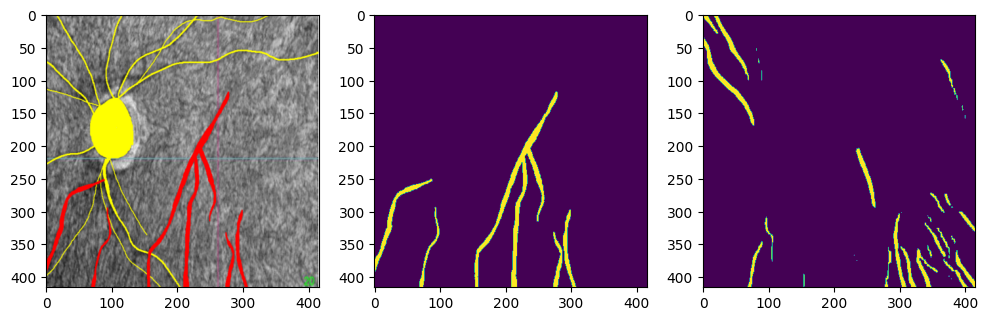

100%|██████████| 42/42 [03:36<00:00,  5.16s/it, Epoch=150, Loss=4.900642, Mean Loss=4.455520, lr=0.001674]


Testing...
jaccard, f1, recall, precision, acc
0.45659392303513757 0.6269337195691748 0.630698224318011 0.6232138872505848 0.9317732369624552


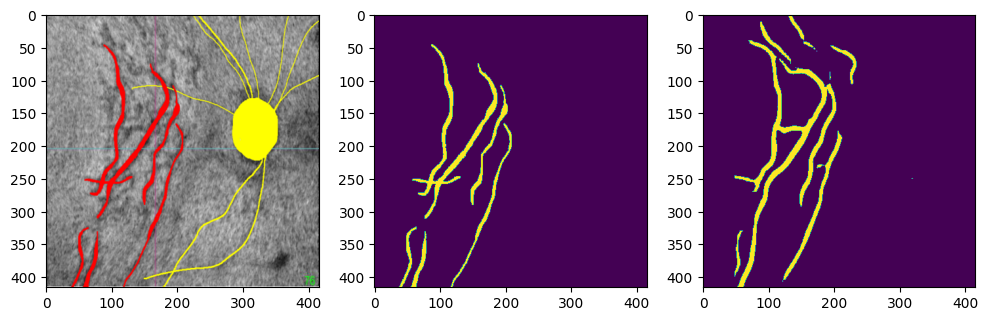

100%|██████████| 42/42 [03:25<00:00,  4.89s/it, Epoch=155, Loss=4.392190, Mean Loss=4.430511, lr=0.001500]


Testing...
jaccard, f1, recall, precision, acc
0.4198525186256329 0.5914029987171278 0.6178044908873539 0.5671655311202413 0.9224053990176264


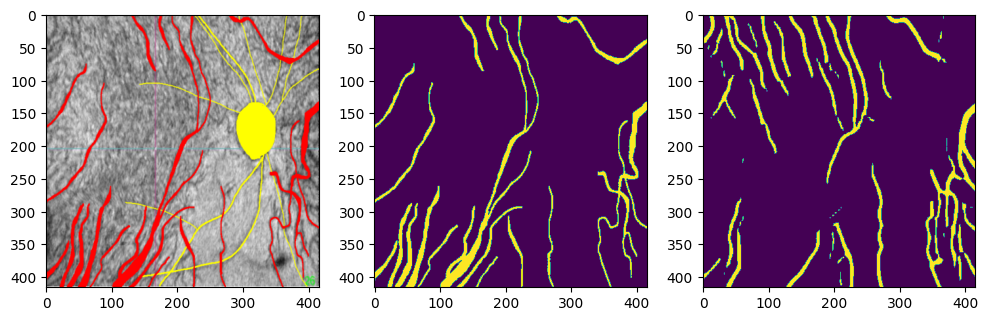

100%|██████████| 42/42 [03:36<00:00,  5.16s/it, Epoch=160, Loss=4.795055, Mean Loss=4.391050, lr=0.001326]


Testing...
jaccard, f1, recall, precision, acc
0.4808156428041668 0.6493929816863139 0.6644165907965963 0.6350337690327896 0.9347887877375198


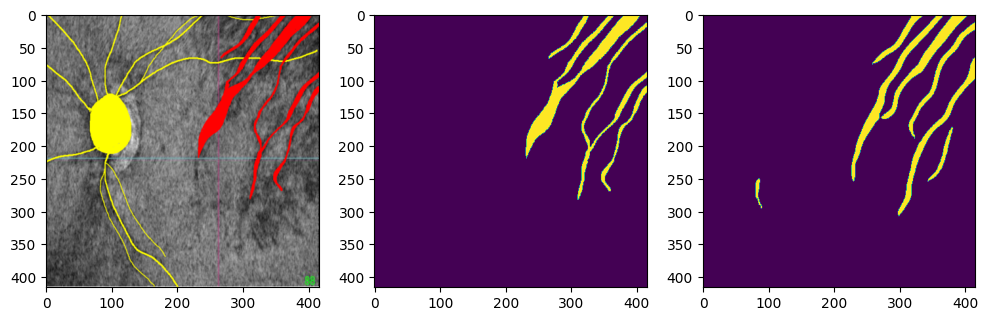

100%|██████████| 42/42 [03:28<00:00,  4.97s/it, Epoch=165, Loss=4.331438, Mean Loss=4.348322, lr=0.001158]


Testing...
jaccard, f1, recall, precision, acc
0.35532416566548924 0.5243382722258457 0.5660764440802363 0.48833235801737523 0.9066465174181182


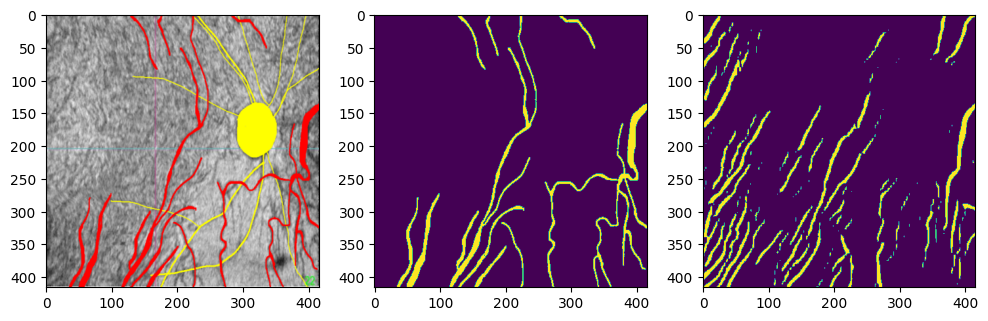

100%|██████████| 42/42 [03:37<00:00,  5.17s/it, Epoch=170, Loss=4.745788, Mean Loss=4.367984, lr=0.001000]


Testing...
jaccard, f1, recall, precision, acc
0.47758881922208063 0.6464434665572538 0.6219954914912104 0.6728919636517566 0.938157883599675


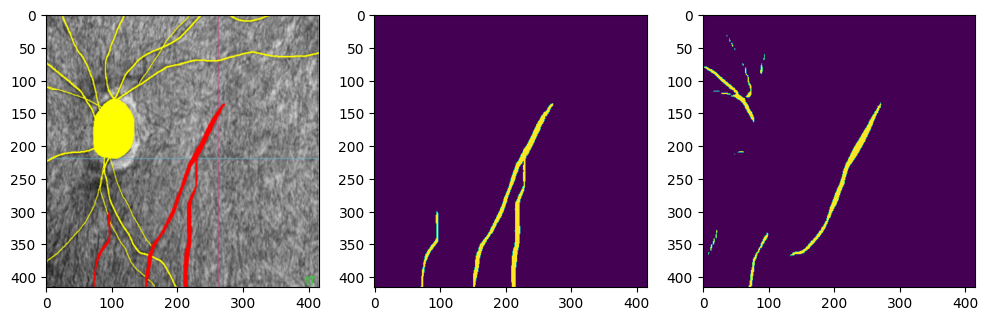

100%|██████████| 42/42 [03:34<00:00,  5.12s/it, Epoch=175, Loss=4.179512, Mean Loss=4.320397, lr=0.000857]


Testing...
jaccard, f1, recall, precision, acc
0.47818326628976404 0.646987795349629 0.6669276453822168 0.628205658040314 0.9338482796743479


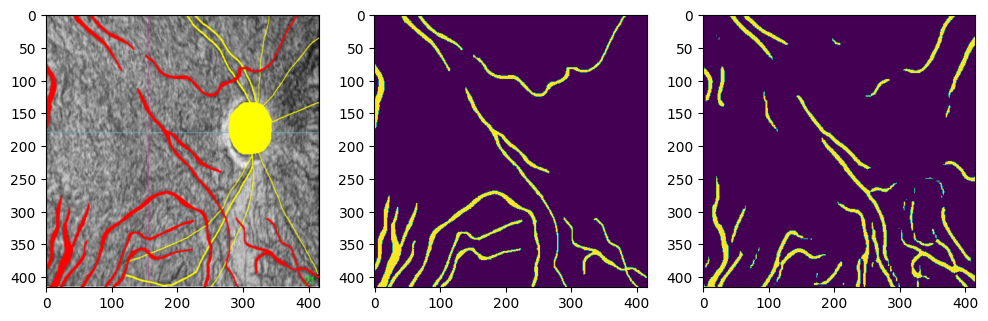

100%|██████████| 42/42 [03:44<00:00,  5.34s/it, Epoch=180, Loss=4.517550, Mean Loss=4.285026, lr=0.000734]


Testing...
jaccard, f1, recall, precision, acc
0.4566331143461311 0.626970662480249 0.700954745144614 0.567113229020347 0.9241851046180932


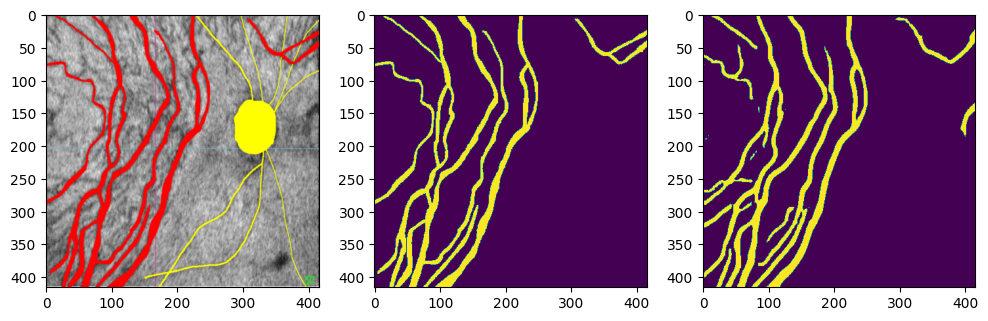

100%|██████████| 42/42 [03:49<00:00,  5.47s/it, Epoch=185, Loss=4.680865, Mean Loss=4.265459, lr=0.000634]


Testing...
jaccard, f1, recall, precision, acc
0.47073955978011994 0.6401399304857169 0.638053382921677 0.6422401695836386 0.9347944522720644


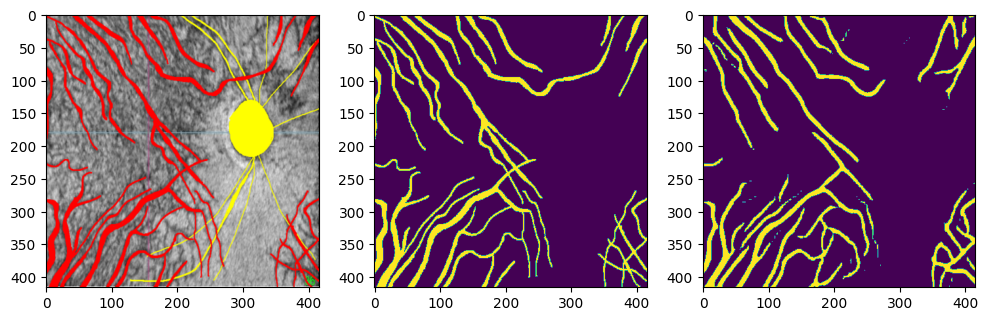

100%|██████████| 42/42 [03:40<00:00,  5.25s/it, Epoch=190, Loss=3.901420, Mean Loss=4.216034, lr=0.000560]


Testing...
jaccard, f1, recall, precision, acc
0.4829398745139811 0.6513276536882656 0.6735668436212193 0.6305100713442764 0.9344507875656305
Model Saved


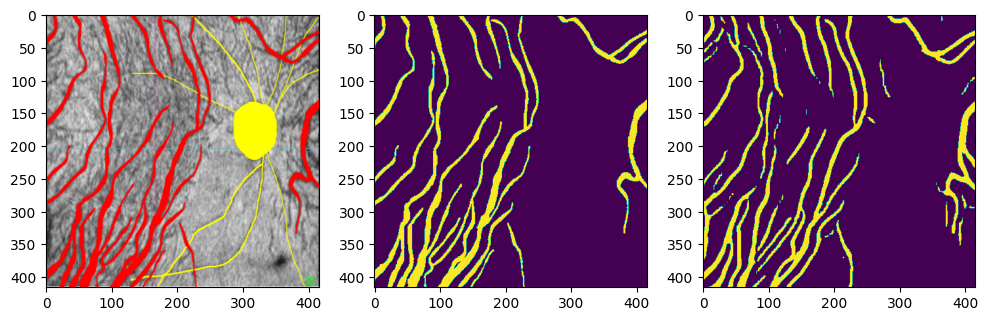

100%|██████████| 42/42 [03:25<00:00,  4.90s/it, Epoch=195, Loss=4.505397, Mean Loss=4.215797, lr=0.000515]


Testing...
jaccard, f1, recall, precision, acc
0.47619150085098055 0.6451622307491546 0.6657908478847472 0.625773496415878 0.9334316922243521


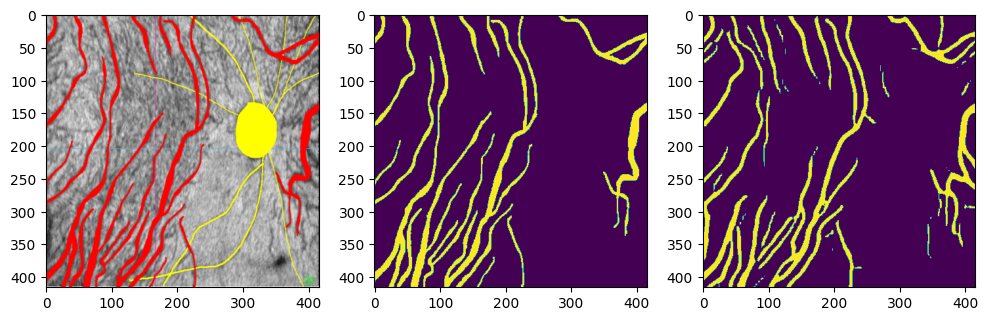

100%|██████████| 42/42 [03:32<00:00,  5.07s/it, Epoch=200, Loss=4.063678, Mean Loss=4.212318, lr=0.000500]


Testing...
jaccard, f1, recall, precision, acc
0.483738051440119 0.652053172014564 0.6402245443676949 0.6643271126505386 0.9378943688015668
Model Saved


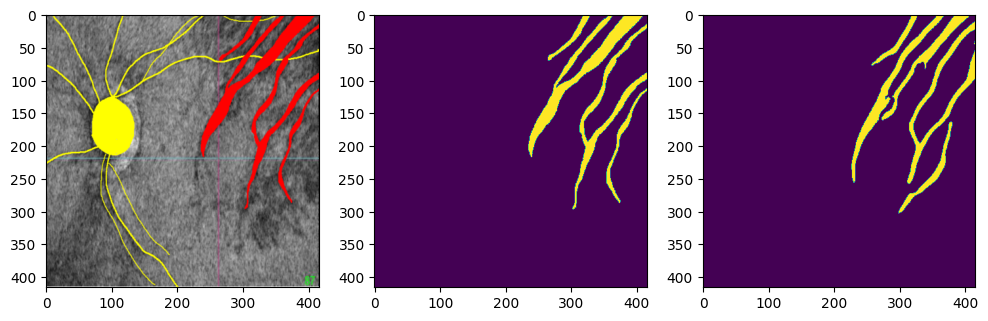

100%|██████████| 42/42 [03:20<00:00,  4.76s/it, Epoch=205, Loss=5.137965, Mean Loss=4.266081, lr=0.000875]


Testing...
jaccard, f1, recall, precision, acc
0.44366042787080023 0.614632664725926 0.5703969192572923 0.6663064397362519 0.9349862488540712


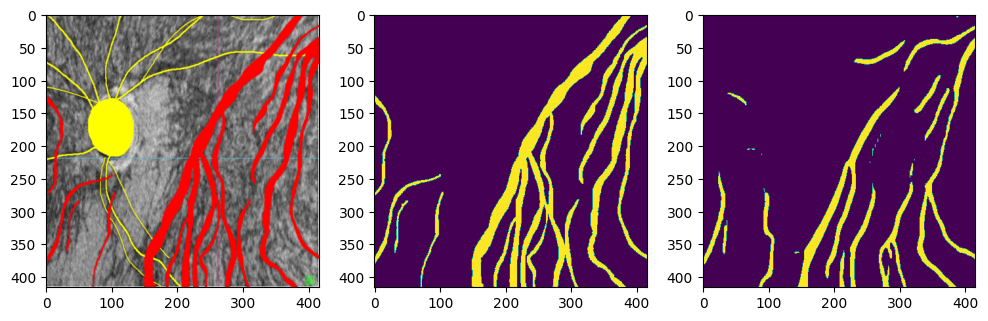

100%|██████████| 42/42 [03:27<00:00,  4.95s/it, Epoch=210, Loss=4.195485, Mean Loss=4.349454, lr=0.001250]


Testing...
jaccard, f1, recall, precision, acc
0.3873072310287761 0.558358267536115 0.5312984634251343 0.5883223828695655 0.9236050758136095


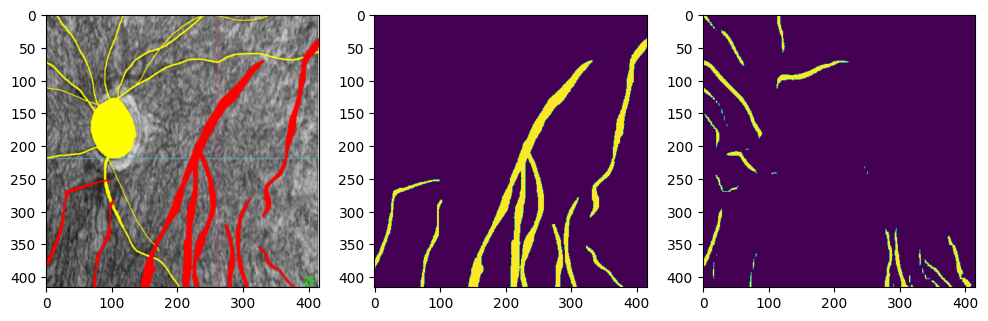

100%|██████████| 42/42 [03:31<00:00,  5.04s/it, Epoch=215, Loss=5.004816, Mean Loss=4.365342, lr=0.001244]


Testing...
jaccard, f1, recall, precision, acc
0.45376325454089567 0.6242601787100417 0.60214308175988 0.6480639793262928 0.9341144639657472


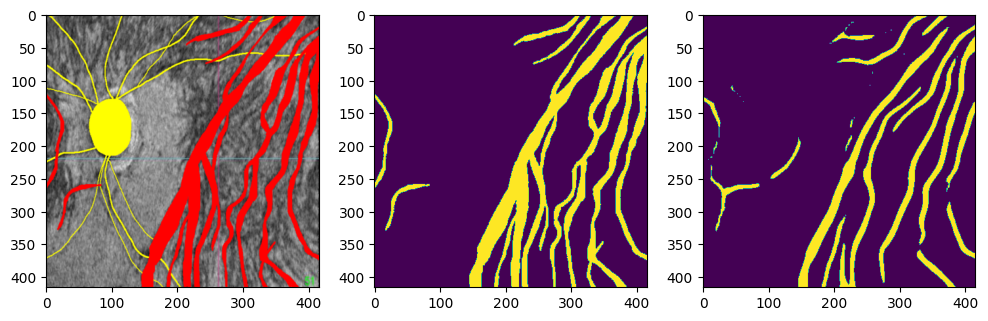

100%|██████████| 42/42 [03:19<00:00,  4.75s/it, Epoch=220, Loss=4.331864, Mean Loss=4.299076, lr=0.001227]


Testing...
jaccard, f1, recall, precision, acc
0.43660041191572335 0.6078244281351857 0.5556155074364607 0.67086265251144 0.9348303276575132


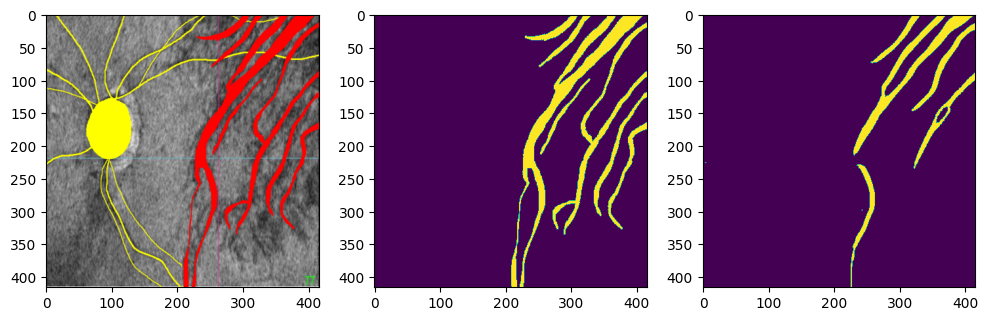

100%|██████████| 42/42 [03:41<00:00,  5.26s/it, Epoch=225, Loss=4.518350, Mean Loss=4.341044, lr=0.001200]


Testing...
jaccard, f1, recall, precision, acc
0.4668670388424825 0.6365499073602353 0.6391518573781166 0.633969056224254 0.9336585177671056


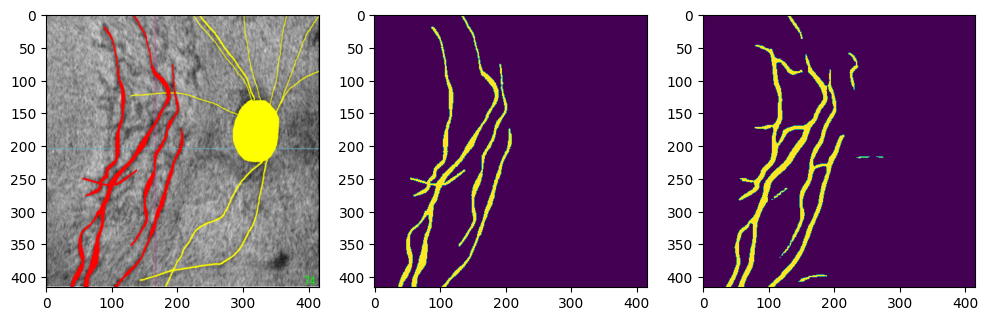

100%|██████████| 42/42 [03:29<00:00,  4.99s/it, Epoch=230, Loss=3.919412, Mean Loss=4.292770, lr=0.001162]


Testing...
jaccard, f1, recall, precision, acc
0.46730761016766037 0.6369592946011694 0.6661465000318761 0.6102224031827471 0.9309788511021752


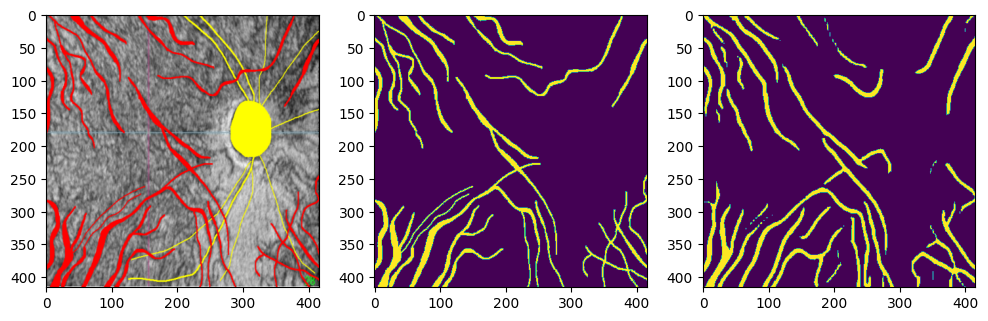

100%|██████████| 42/42 [03:31<00:00,  5.05s/it, Epoch=235, Loss=5.029119, Mean Loss=4.314661, lr=0.001116]


Testing...
jaccard, f1, recall, precision, acc
0.48040578701822695 0.6490190611667909 0.6405245027495886 0.6577419553562152 0.9370304458965331


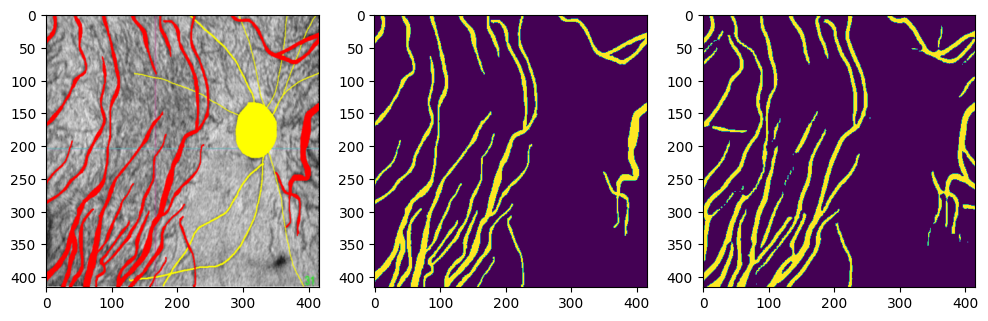

100%|██████████| 42/42 [03:38<00:00,  5.19s/it, Epoch=240, Loss=4.729574, Mean Loss=4.320604, lr=0.001063]


Testing...
jaccard, f1, recall, precision, acc
0.4229818659889977 0.5945007116376957 0.6187944430874188 0.5720424528684525 0.9232721704673306


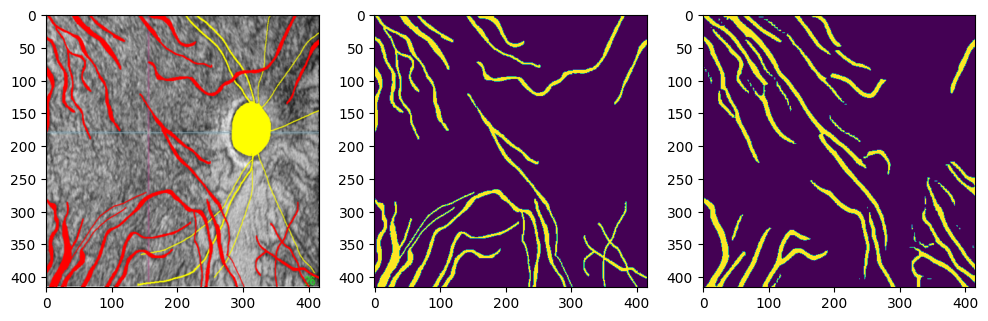

100%|██████████| 42/42 [03:28<00:00,  4.96s/it, Epoch=245, Loss=4.471442, Mean Loss=4.287514, lr=0.001003]


Testing...
jaccard, f1, recall, precision, acc
0.43652902965093165 0.6077552498288261 0.6797766089051286 0.5495330133469223 0.9202439884313276


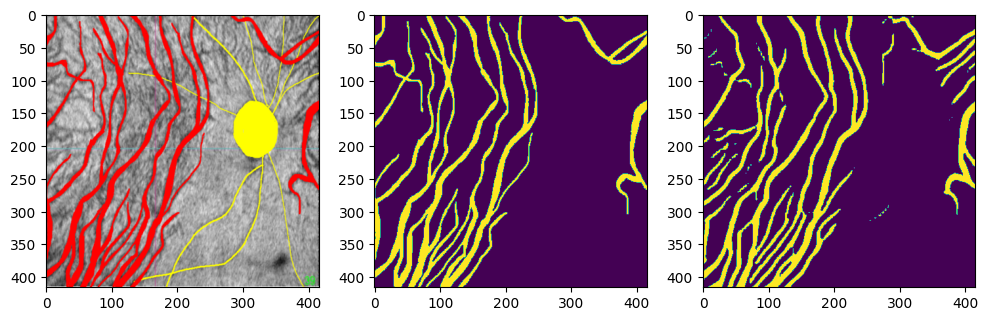

100%|██████████| 42/42 [03:35<00:00,  5.12s/it, Epoch=250, Loss=5.048090, Mean Loss=4.266336, lr=0.000940]


Testing...
jaccard, f1, recall, precision, acc
0.47836057065167464 0.6471500662937851 0.671420216084646 0.624573314025052 0.9334499717424368


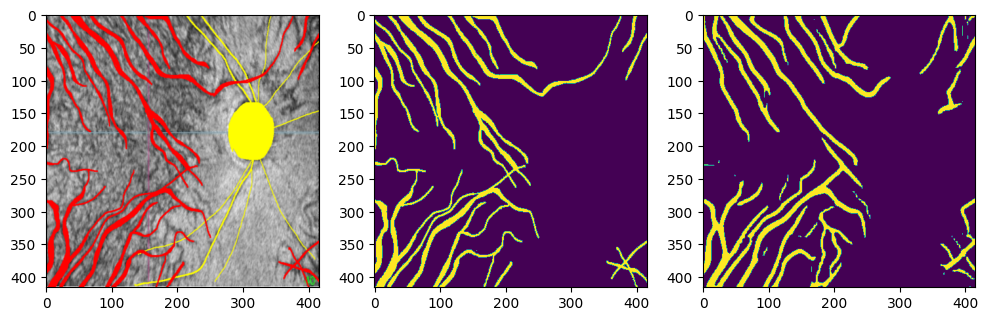

100%|██████████| 42/42 [03:36<00:00,  5.15s/it, Epoch=255, Loss=4.370163, Mean Loss=4.261036, lr=0.000875]


Testing...
jaccard, f1, recall, precision, acc
0.4557898941668182 0.626175378731664 0.5776503606305609 0.683600659936613 0.9373089196235103


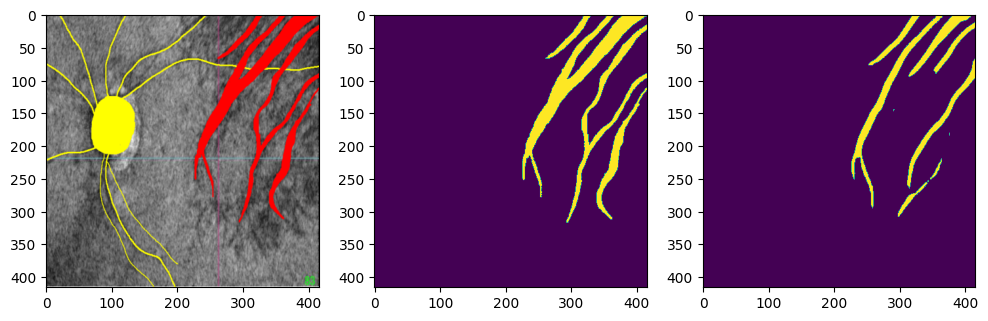

100%|██████████| 42/42 [03:31<00:00,  5.04s/it, Epoch=260, Loss=4.671007, Mean Loss=4.217228, lr=0.000810]


Testing...
jaccard, f1, recall, precision, acc
0.4839461531606809 0.6522422018210245 0.6195109406909751 0.6886250394881657 0.9399537689338695
Model Saved


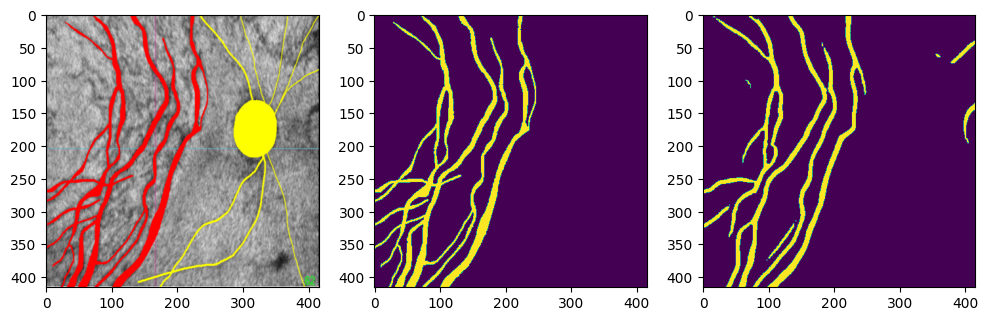

100%|██████████| 42/42 [03:37<00:00,  5.19s/it, Epoch=265, Loss=4.214211, Mean Loss=4.234006, lr=0.000747]


Testing...
jaccard, f1, recall, precision, acc
0.46721257264572535 0.6368710047286911 0.6262099515267255 0.6479013480250243 0.9350920031096341


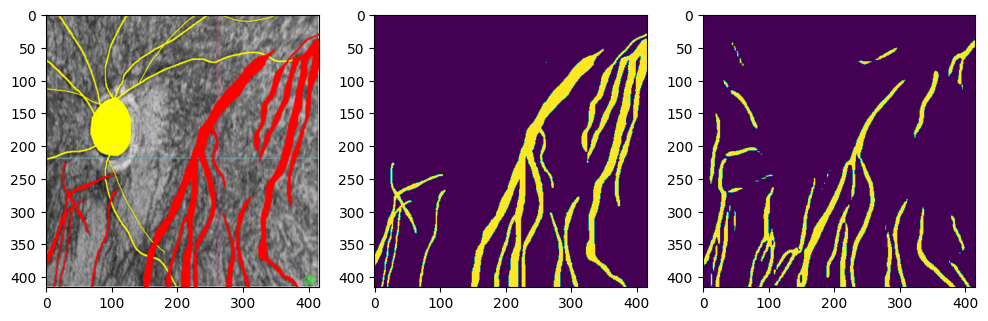

100%|██████████| 42/42 [03:39<00:00,  5.22s/it, Epoch=270, Loss=4.529999, Mean Loss=4.215373, lr=0.000688]


Testing...
jaccard, f1, recall, precision, acc
0.4739314593762033 0.6430848006687915 0.6447027886996455 0.6414749135233251 0.9349533196776815


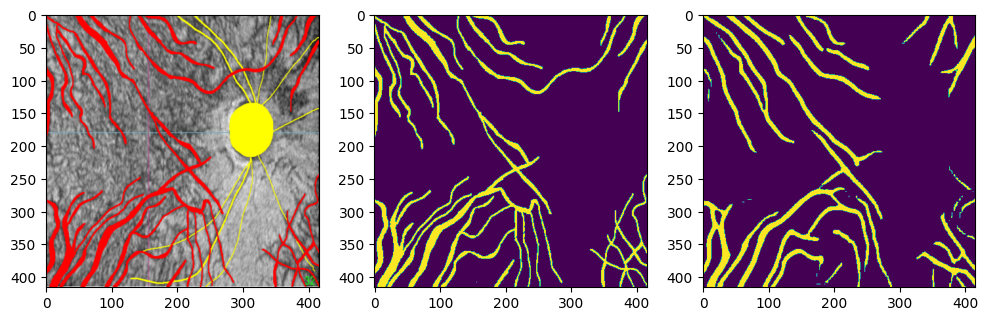

100%|██████████| 42/42 [03:28<00:00,  4.98s/it, Epoch=275, Loss=4.519940, Mean Loss=4.185546, lr=0.000634]


Testing...
jaccard, f1, recall, precision, acc
0.4748907306053825 0.6439673404286149 0.6605540222359596 0.6281932460546806 0.9336099297337278


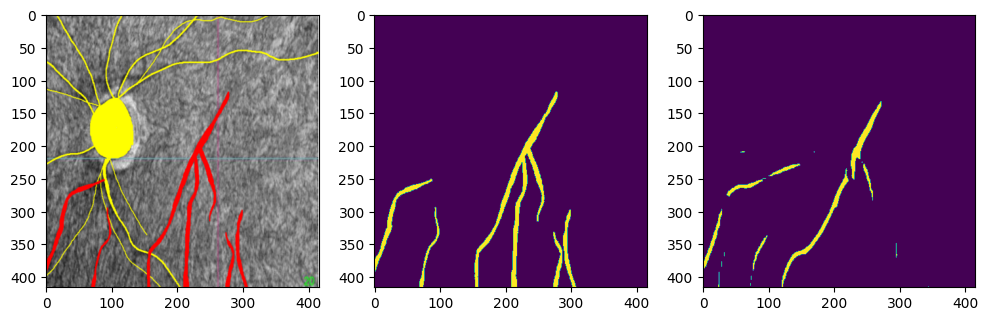

100%|██████████| 42/42 [03:32<00:00,  5.06s/it, Epoch=280, Loss=4.628698, Mean Loss=4.175788, lr=0.000588]


Testing...
jaccard, f1, recall, precision, acc
0.47699731916960225 0.645901401415921 0.6798066942831335 0.6152174888957064 0.9322495461861405


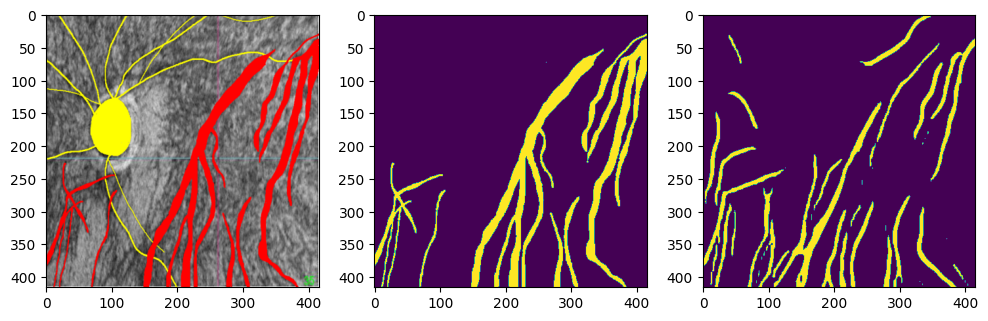

100%|██████████| 42/42 [03:36<00:00,  5.15s/it, Epoch=285, Loss=3.856562, Mean Loss=4.152797, lr=0.000550]


Testing...
jaccard, f1, recall, precision, acc
0.45553538035166774 0.6259351527980132 0.646455261968429 0.6066776835947879 0.929769652028294


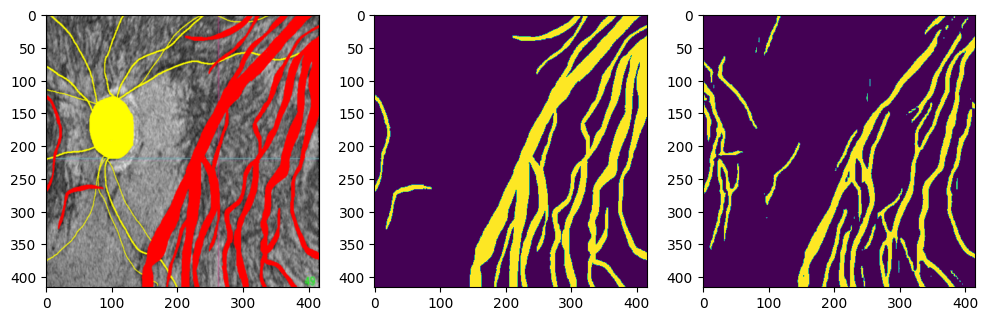

100%|██████████| 42/42 [03:24<00:00,  4.86s/it, Epoch=290, Loss=3.891141, Mean Loss=4.163335, lr=0.000523]


Testing...
jaccard, f1, recall, precision, acc
0.47203281206765413 0.6413346335733169 0.6812584928514993 0.6058310558923123 0.9307395245176682


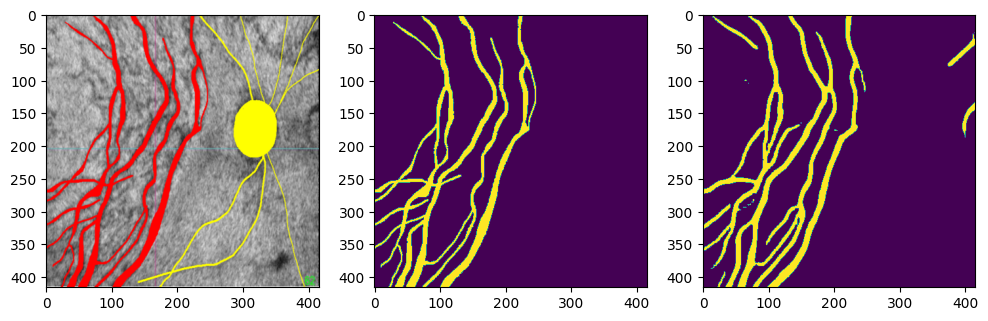

100%|██████████| 42/42 [03:24<00:00,  4.86s/it, Epoch=295, Loss=4.315856, Mean Loss=4.123533, lr=0.000506]


Testing...
jaccard, f1, recall, precision, acc
0.48411479492050885 0.6523953491703297 0.6321047157397386 0.674031848336671 0.9387744714403283
Model Saved


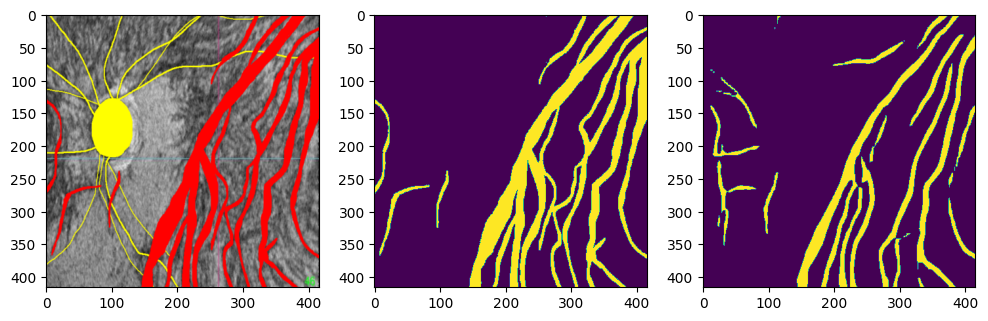

100%|██████████| 42/42 [03:17<00:00,  4.70s/it, Epoch=299, Loss=4.542344, Mean Loss=4.127714, lr=0.000500]


Testing...
jaccard, f1, recall, precision, acc
0.48190822036700726 0.6503887538293817 0.6451252375491305 0.6557388657058735 0.9369586951256355


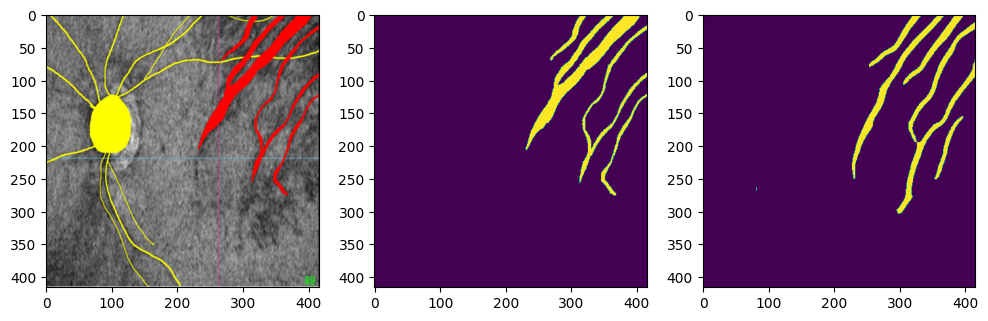

In [21]:
from tensorboardX import SummaryWriter
import datetime 

exp = 'aug50+focal+coslr'

num_epochs = args['epoch_num']
resume_epochs = args['last_epoch']
load_from = '../model/vessel_PFNet_base_b32_e500_220921_00:30.pt'


batch_size = args['train_batch_size']
scaler = torch.cuda.amp.GradScaler()
now = datetime.datetime.now()
log_name = f'{exp}_b{batch_size}_e{num_epochs}_js_'+now.strftime("%y%m%d_%H:%M")
writer = SummaryWriter(log_dir='./ckpt/PFNet/log/'+ log_name)
save_path = f'../model/vessel_PFNet_{exp}_b{batch_size}_e{num_epochs}_'+ now.strftime("%y%m%d_%H:%M") + '.pt'

if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
    net = nn.DataParallel(net)

# net.float()
net = net.to(device)
train_loss_list = []
test_acc_list = []
test_recall_list = []
test_f1_list = []
print(log_name)
print(save_path)
print(f'Training {num_epochs} epochs.')
if resume_epochs != 0:
    print(f'Resuming from epoch {resume_epochs}')
    net.load_state_dict(torch.load(load_from))
if args['amp'] == True:
    print("Using mixed precision.")

# print(data.shape, aug_masks[0].shape, aug_masks[1].shape, aft_mask.shape)
curr_iter = 1

for epoch in range(args['last_epoch'], args['last_epoch'] + args['epoch_num']):
    
    net.train()

    loss_1_running, loss_2_running, loss_3_running, loss_4_running, loss_running = 0, 0, 0, 0, 0
    tqdm_dataset = tqdm(train_loader)
    for batch_idx, batch in enumerate(tqdm_dataset):
        if args['poly_train']:
            base_lr = args['lr'] * (1 - float(curr_iter) / float(num_epochs)) ** args['lr_decay']
            optimizer.param_groups[0]['lr'] = 2 * base_lr
            optimizer.param_groups[1]['lr'] = 1 * base_lr

        image, masks = batch
        labels = masks[0]
        labels = labels.unsqueeze(1)
        image, labels = image.float().to(device), labels.float().to(device)
        optimizer.zero_grad()

        # mixed precision
        if args['amp'] == True:
            with torch.cuda.amp.autocast():

                predict_1, predict_2, predict_3, predict_4 = net(image)
                
                loss_1 = focal_iou_loss(predict_1, labels)
                loss_2 = structure_loss(predict_2, labels)
                loss_3 = structure_loss(predict_3, labels)
                loss_4 = structure_loss(predict_4, labels)
                loss = 1 * loss_1 + 1 * loss_2 + 2 * loss_3 + 4 * loss_4

            scaler.scale(loss).backward()
            # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
            scaler.step(optimizer)
            scaler.update()

        else:
            predict_1, predict_2, predict_3, predict_4 = net(image)

            loss_1 = focal_iou_loss(predict_1, labels)
            loss_2 = structure_loss(predict_2, labels)
            loss_3 = structure_loss(predict_3, labels)
            loss_4 = structure_loss(predict_4, labels)
            loss = 1 * loss_1 + 1 * loss_2 + 2 * loss_3 + 4 * loss_4
            
            loss.backward()
            # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
            optimizer.step()
        
        loss_1_running += loss_1.item()
        loss_2_running += loss_2.item()
        loss_3_running += loss_3.item()
        loss_4_running += loss_4.item()
        loss_running += loss.item()
        
        tqdm_dataset.set_postfix({
            'Epoch': epoch,
            'Loss': '{:06f}'.format(loss.item()),
            'Mean Loss' : '{:06f}'.format(loss_running/(batch_idx+1)),
            'lr' : '{:06f}'.format(optimizer.param_groups[0]["lr"])
        })

        curr_iter += 1

    epoch_loss = loss_running / len(train_loader)
    epoch_loss_1 = loss_1_running / len(train_loader)
    epoch_loss_2 = loss_2_running / len(train_loader)
    epoch_loss_3 = loss_3_running / len(train_loader)
    epoch_loss_4 = loss_4_running / len(train_loader)

    scheduler.step()

    writer.add_scalar('loss/Train', epoch_loss, epoch)
    writer.add_scalar('learning_rate', optimizer.param_groups[0]["lr"], epoch)
    train_loss_list.append(epoch_loss)

## EVAL
    if epoch % 5 == 0 or epoch == args['epoch_num']-1 :
        print("Testing...")

        images=[]
        preds=[]
        labels=[]
        label_os = []
        net.eval()
        # tqdm_loader = tqdm(test_loader)
        with torch.no_grad():
            for idx, dd in enumerate(test_loader):

                image, masks = dd 
                
                image = image.float().to(device)
                label = masks[0].float()
                label_o = masks[1].float()
                _, _, _, pred = net(image)    

                images.append(image.cpu().detach().numpy())
                labels.append(label.numpy())
                label_os.append(label_o)
                preds.append(pred.cpu().detach().numpy())

            images= np.array(images).squeeze(1)
            preds = np.array(preds).squeeze(1)
            labels = np.array(labels)
            label_os = np.array(label_os)
            preds = np.where(preds > 0.5 , 1 , 0)
            labels = np.where(labels > 0.5 , 1 , 0)
            
            score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
            test_acc_list.append(score_acc)
            test_recall_list.append(score_recall)
            test_f1_list.append(score_f1)
            writer.add_scalar('Accuracy/Test', score_acc, epoch)
            writer.add_scalar('F1/Test', score_f1, epoch)
            writer.add_scalar('Recall/Test', score_recall, epoch)
            writer.add_scalar('Precision/Test', score_precision, epoch)
            writer.add_scalar('Jaccard/Test', score_jaccard, epoch)

            if np.max(test_f1_list) == test_f1_list[-1] or np.max(test_recall_list) == test_recall_list[-1]:
                torch.save(net.state_dict(), save_path)
                print("Model Saved")

            randnum = np.random.randint(0, 171)
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 3, 1)  
            plt.imshow(label_os[randnum][0])
            plt.subplot(1, 3, 2)  
            plt.imshow(labels[randnum][0])
            plt.subplot(1, 3, 3)
            plt.imshow(preds[randnum][0])
            plt.tight_layout()
            plt.show()

# 1200m

# evaluation

In [28]:
print("Testing...")
net = PFNet(backbone_path)
load_from = '/home/sklab2/workspace/code_only/junsu/model/vessel_PFNet_aug50+focal+coslr_b32_e300_220928_01:55.pt'
if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
# load_from
net = nn.DataParallel(net)
net.load_state_dict(torch.load(load_from))
net.to(device)

images=[]
preds=[]
labels=[]
label_os = []
net.eval()
# tqdm_loader = tqdm(test_loader)
with torch.no_grad():
    for idx, dd in enumerate(tqdm(test_loader)):

        image, masks = dd 
        
        image = image.float().to(device)
        label = masks[0].float()
        label_o = masks[1].float()
        _, _, _, pred = net(image)    

        images.append(image.cpu().detach().numpy())
        labels.append(label.numpy())
        label_os.append(label_o)
        preds.append(pred.cpu().detach().numpy())

    images= np.array(images).squeeze(1)
    preds = np.array(preds).squeeze(1)
    labels = np.array(labels).squeeze(1)
    label_os = np.array(label_os)
    preds = np.where(preds > 0.5 , 1 , 0)
    labels = np.where(labels > 0.5 , 1 , 0)
    
    score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)

Testing...
From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!
Using 2 GPUs.


100%|██████████| 355/355 [00:58<00:00,  6.06it/s]


jaccard, f1, recall, precision, acc
0.48411479492050885 0.6523953491703297 0.6321047157397386 0.674031848336671 0.9387744714403283


In [29]:
preds.shape

(355, 1, 416, 416)

In [31]:
# images = images.squeeze(1)

In [32]:
images.shape

(355, 3, 416, 416)

In [27]:
import pydensecrf.densecrf as dcrf
import pydensecrf.utils as utils

# from pydensecrf.utils import unary_from_labels, create_pairwise_bilateral, create_pairwise_gaussian

def dense_crf(img, output_probs):
    c = output_probs.shape[0]
    h = output_probs.shape[1]
    w = output_probs.shape[2]

    U = utils.unary_from_softmax(output_probs)
    U = np.ascontiguousarray(U)

    img = np.ascontiguousarray(img)

    d = dcrf.DenseCRF2D(w, h, c)
    d.setUnaryEnergy(U)
    d.addPairwiseGaussian(sxy=3, compat=3)
    d.addPairwiseBilateral(sxy=80, srgb=13, rgbim=img, compat=10)

    Q = d.inference(10)
    Q = np.array(Q).reshape((c, h, w))
    return Q

In [39]:
img = np.uint8(images[0]).permute(1, 2, 0)
pred = preds[0]
print(img.shape, pred.shape)

AttributeError: 'numpy.ndarray' object has no attribute 'permute'

In [37]:
dense_crf(img, pred)

ValueError: Bad shape for pairwise bilateral (Need (416, 416, 3), got [3, 416, 416, 0, 0, 0, 0, 0])

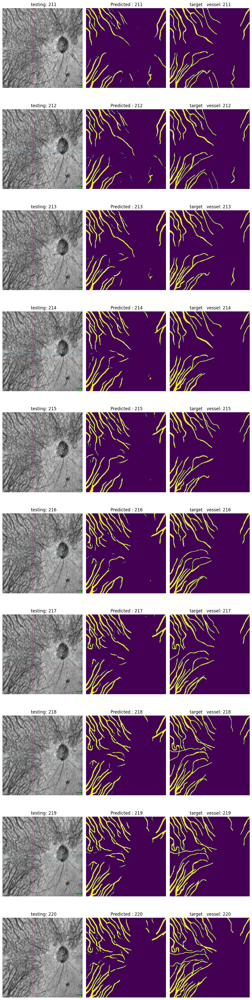

In [21]:
# randnum = np.random.randint(0, len(test_dataset)-10)
randnum=211

fig, axes = plt.subplots(10, 3, figsize = (10,40))
[c_ax.axis('off') for c_ax in axes.flatten()]

for idx, (img_ax, target_ax , mask_ax ) in zip(range(randnum, randnum+10), axes):
    
# inputs[:10] , preds[:10], targets[:10], urls_list[:10]) :
    
    image = images[idx][0].astype(int).transpose(1, 2, 0) 
    img_target = preds[idx].transpose(1, 2, 0) 
    img_mask = labels[idx].transpose(1, 2, 0)  
 
    img_ax.imshow(np.clip(image, 0, 255))

    target_ax.imshow(img_target )
    mask_ax.imshow(img_mask)

    img_ax.set_title(f'  testing: {idx}')
    target_ax.set_title(f' Predicted : {idx}')
    
    mask_ax.set_title(f' target vessel: {idx}')
plt.tight_layout()
plt.show()